In [17]:
from spatialdata import read_zarr, transform, aggregate, get_centroids, SpatialData
from spatialdata.models import Image2DModel, PointsModel, Labels2DModel
from spatialdata.transformations import get_transformation, set_transformation, Identity
import spatialdata_plot
import matplotlib.pyplot as plt
from pandas import read_csv
from matplotlib.colors import Normalize
from numpy import histogram, diff, newaxis
import numpy as np
from scipy.ndimage import affine_transform
from xarray import open_zarr, open_dataarray
import seaborn as sns
from skimage import measure
from skimage import io
from skimage import transform as sk_transform
from skimage import filters

from skimage.morphology import binary_erosion, remove_small_holes
from scipy.ndimage import distance_transform_edt
from skimage.filters import difference_of_gaussians

from scipy.ndimage import distance_transform_edt
import matplotlib.transforms as mtransforms
import geopandas as gpd
import pandas as pd

from matplotlib import colors, cm
import matplotlib.patches as mpatches

from src.utils import crop_cell, get_shape_transform, read_obs
import xarray as xr

In [13]:
custom_palette = {
    'Astrocyte': '#FFC300',
    'Microglia-PVM': '#FF5733',
    'VLMC': '#5DADE2',
    'Endothelial': '#AED6F1',
    'Sst Chodl': '#27AE60',
    'CN ST18 GABA': '#A9DFBF',
    'STR D1 MSN': '#8E44AD',
    'STR D2 MSN': '#D2B4DE',
    'STR Hybrid MSN': '#E8DAEF',
    'Oligodendrocyte': '#D35400',
    'OPC': '#FAD7A0',
    "AQP4":cm.tab10.colors[0], 
    "DRD1":cm.tab10.colors[3],
    "DRD2":cm.tab10.colors[6],
                 }

In [3]:
sdata = read_zarr("/root/capsule/data/sdata_ptau_2/1417648795_CAH_processed_tau.zarr")

/tmp/ipykernel_5081/3026488193.py:1: UserWarning: SpatialData is not stored in the most current format. If you want to use Zarr v3, please write the store to a new location using `sdata.write()`.
  sdata = read_zarr("/root/capsule/data/sdata_ptau_2/1417648795_CAH_processed_tau.zarr")
no parent found for <ome_zarr.reader.Label object at 0x7fa40c6c65a0>: None
no parent found for <ome_zarr.reader.Label object at 0x7fa40c662930>: None
no parent found for <ome_zarr.reader.Label object at 0x7fa40c5203e0>: None
no parent found for <ome_zarr.reader.Label object at 0x7fa40c530b00>: None
no parent found for <ome_zarr.reader.Label object at 0x7fa40c53cf50>: None


In [4]:
obs = read_obs('/root/capsule/data/combined_adata/CaH_Xenium.2026-01-07.h5ad')

In [5]:
obs.index = obs["barcode"].astype(str) + "_" + obs["cell_id"].astype(str)

In [6]:
sdata["mapped_table"].obs["cell_idx"] = "1417648795" + "_" + sdata["mapped_table"].obs["cell_id"].astype(str)

In [7]:
obs = obs.loc[obs.index.intersection(sdata["mapped_table"].obs["cell_idx"]), ["Neighborhood", "Subclass", "Supertype"]].astype("str").fillna("Unknown").astype("category")

In [8]:
sdata["mapped_table"].obs = sdata["mapped_table"].obs.merge(obs, left_on = "cell_idx", right_index = True, how = "outer")

In [15]:
pathology_image = sdata['aligned_image_warped']['scale0']['image'].sel(c= [1, 2]).assign_coords(c = ["AT8", "6E10"])

In [16]:
morphology_image = sdata['morphology_focus']['scale0']['image'].sel(c=['DAPI', 'ATP1A1/CD45/E-Cadherin'])

In [18]:
new_image = xr.concat([morphology_image, pathology_image], dim = "c")

In [20]:
sdata['stains'] = Image2DModel.parse(new_image, dims = ("c", "y", "x"), scale_factors = [2,2,2,2], chunks = (1, 4096, 4096))

# Figure 4B

In [21]:
sdata_sample = sdata.query.bounding_box(min_coordinate=[5750 // 0.2125, 3600 // 0.2125], max_coordinate=[6000 // 0.2125, 3850 // 0.2125], axes=("x", "y"), target_coordinate_system="global")

/tmp/ipykernel_5081/2927824746.py:1: UserWarning: The object has `points` element. Depending on the number of points, querying MAY suffer from performance issues. Please consider filtering the object before calling this function by calling the `subset()` method of `SpatialData`.
  sdata_sample = sdata.query.bounding_box(min_coordinate=[5750 // 0.2125, 3600 // 0.2125], max_coordinate=[6000 // 0.2125, 3850 // 0.2125], axes=("x", "y"), target_coordinate_system="global")


In [23]:
min_quantile = xr.DataArray([  58., 3040.,  3000.,   1000.], coords = {"c":range(4)})

In [24]:
max_quantile = sdata_sample['stains']['scale0']['image'].quantile(0.998, dim = ["x","y"])

In [25]:
norm_image = (sdata_sample['stains']['scale0']['image'] - min_quantile)/(max_quantile - min_quantile)

In [29]:
norm_image

<xarray.DataArray (c: 4, y: 1176, x: 1177)> Size: 44MB
dask.array<truediv, shape=(4, 1176, 1177), dtype=float64, chunksize=(1, 1176, 1177), chunktype=numpy.ndarray>
Coordinates:
  * c         (c) int64 32B 0 1 2 3
  * y         (y) float64 9kB 0.5 1.5 2.5 3.5 ... 1.174e+03 1.174e+03 1.176e+03
  * x         (x) float64 9kB 0.5 1.5 2.5 3.5 ... 1.174e+03 1.176e+03 1.176e+03
    quantile  float64 8B 0.998
Attributes:
    transform:  {'global': Sequence \n    Translation (y, x)\n        [16536....

In [30]:
sdata_sample['norm_stains'] = Image2DModel.parse(norm_image)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..2.0].


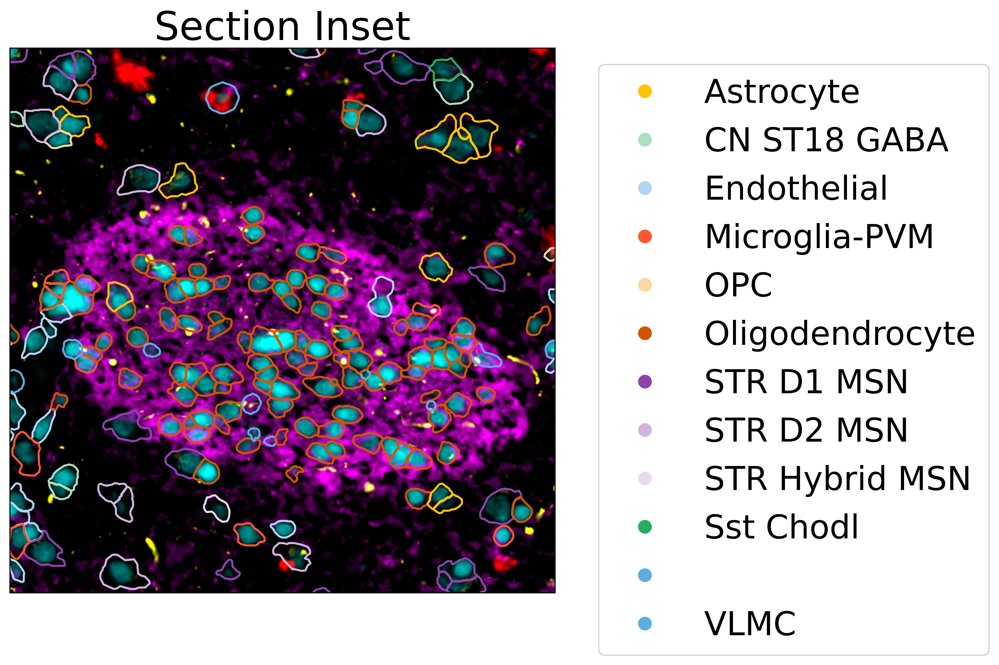

In [37]:
with plt.rc_context({'figure.figsize':(10, 10), 'figure.dpi':600, 'font.size':24}):
    ax = sdata_sample.pl.render_images("norm_stains", palette = ['Cyan', 'Magenta', 'Yellow', 'Red']).pl.show(title = "Section Inset",return_ax = True)
    gdf = transform(sdata_sample["cell_boundaries"], to_coordinate_system="global")
    # gdf = sdata_sample['cell_boundaries']
    gdf.index =  "1417648795" + "_" + gdf.index
    gdf["Subclass"] = sdata["mapped_table"].obs.set_index("cell_idx")["Subclass"].apply(lambda x: "_".join(x.split("_")[:-1]))
    gdf["Subclass"] = gdf["Subclass"].cat.remove_unused_categories()
    gdf_2 = pd.concat({"geometry":gdf.boundary, "feature_name":gdf['Subclass']},axis = 1).set_geometry("geometry")
    cmap = colors.ListedColormap([t[1] for t in sorted(custom_palette.items()) if t[0] in gdf_2["feature_name"].values])
    gdf_2.plot(column = 'feature_name', ax = ax, cmap = cmap, legend = True,legend_kwds = {"bbox_to_anchor":(1.05, 1), "loc":"upper left"})
    plt.xticks([])
    plt.yticks([])
    # plt.savefig("/scratch/figure6_section_inset.svg", bbox_inches = "tight")
    plt.show()

# Figure 4E

In [33]:
gdf_2

,geometry,feature_name
1417648795_lebjikmp-1,"LINESTRING (28228.001 17373.001, 28227.001 173...",OPC_Subclass
1417648795_lefhlgfj-1,"LINESTRING (28070 17413.001, 28061.002 17416.0...",STR D1 MSN_Subclass
1417648795_lefiiifc-1,"LINESTRING (28104 17363.001, 28097.001 17365, ...",Oligodendrocyte_Subclass
1417648795_lefjabjm-1,"LINESTRING (27881.002 16948.001, 27867.001 169...",STR D1 MSN_Subclass
1417648795_lpoilmkb-1,"LINESTRING (27389 17502, 27386.002 17504, 2738...",Oligodendrocyte_Subclass
...,...,...
1417648795_ohhmgkfi-1,"LINESTRING (27517.001 17015, 27506.002 17019, ...",Unknown
1417648795_ohhokcmf-1,"LINESTRING (27582.001 17687, 27577.001 17690, ...",Unknown
1417648795_ohhooidm-1,"LINESTRING (27583.001 17762, 27582.001 17763.0...",Unknown
1417648795_ohiaojcj-1,"LINESTRING (27964 17704, 27962.001 17705, 2795...",Unknown


In [38]:
sdata_sample = sdata.query.bounding_box(min_coordinate=[2200 // 0.2125, 6000 // 0.2125], max_coordinate=[2450 // 0.2125, 6250 // 0.2125], axes=("x", "y"), target_coordinate_system="global")

/tmp/ipykernel_5081/3609581996.py:1: UserWarning: The object has `points` element. Depending on the number of points, querying MAY suffer from performance issues. Please consider filtering the object before calling this function by calling the `subset()` method of `SpatialData`.
  sdata_sample = sdata.query.bounding_box(min_coordinate=[2200 // 0.2125, 6000 // 0.2125], max_coordinate=[2450 // 0.2125, 6250 // 0.2125], axes=("x", "y"), target_coordinate_system="global")


In [39]:
norm_image = (sdata_sample['stains']['scale0']['image'] - min_quantile)/(max_quantile - min_quantile)

In [40]:
sdata_sample['norm_stains'] = Image2DModel.parse(norm_image, transformations = {"global":get_transformation(sdata_sample['stains'])})

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1294117647058823].


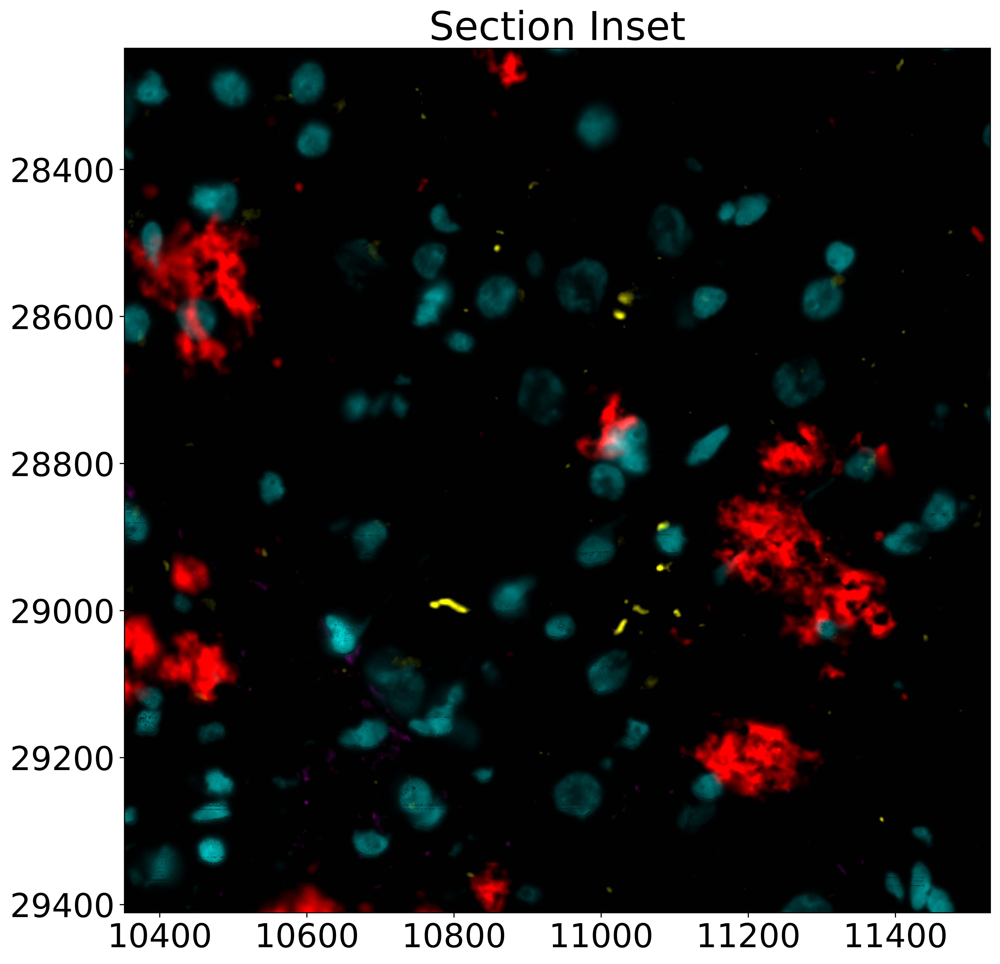

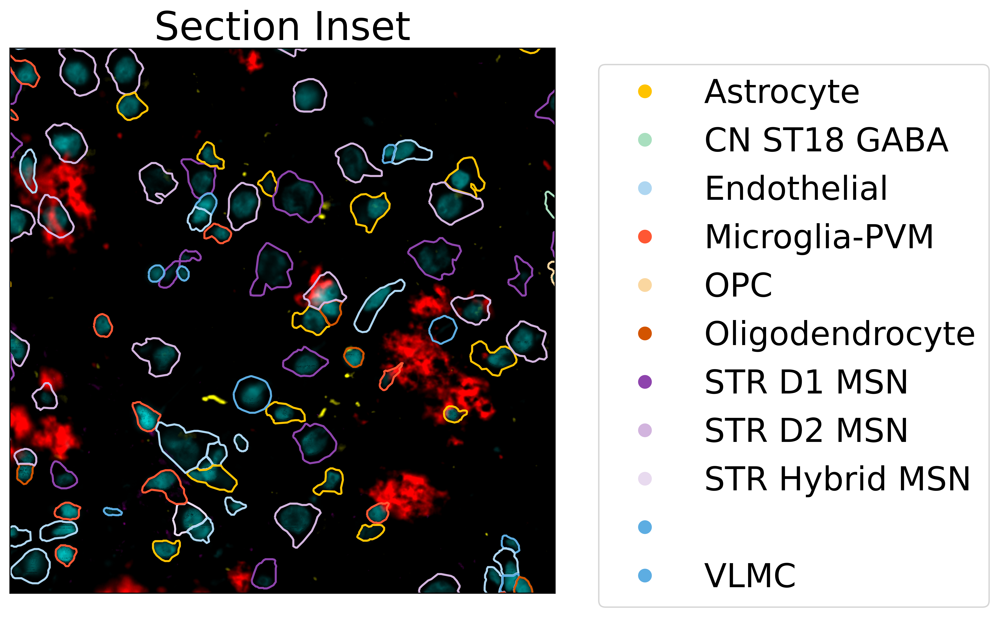

In [42]:
with plt.rc_context({'figure.figsize':(10, 10), 'figure.dpi':600, 'font.size':24}):
    ax = (sdata_sample
        .pl.render_images("norm_stains", palette = ['Cyan', 'Magenta', 'Yellow', 'Red'])
        .pl.show(title = "Section Inset", return_ax = True)
         )
    gdf = transform(sdata_sample["cell_boundaries"], to_coordinate_system="global")
    gdf.index =  "1417648795" + "_" + gdf.index
    gdf["Subclass"] = sdata["mapped_table"].obs.set_index("cell_idx")["Subclass"].apply(lambda x: "_".join(x.split("_")[:-1]))
    gdf["Subclass"] = gdf["Subclass"].cat.remove_unused_categories()
    gdf_2 = pd.concat({"geometry":gdf.boundary, "feature_name":gdf['Subclass']},axis = 1).set_geometry("geometry")
    cmap = colors.ListedColormap([t[1] for t in sorted(custom_palette.items()) if t[0] in gdf_2["feature_name"].values])
    shape_plot = gdf_2.plot(column = 'feature_name', ax = ax, cmap = cmap, legend = True,legend_kwds = {"bbox_to_anchor":(1.05, 1), "loc":"upper left"})
    plt.xticks([])
    plt.yticks([])
    # plt.savefig("/scratch/figure6_section_inset_2.svg", bbox_inches = "tight")
    plt.show()